In [5]:
import matplotlib.pyplot as plt
import pandas as pd
import os 
import numpy as np
import seaborn as sns
from glob import glob
from scipy.stats import entropy, linregress
from kneed import KneeLocator
import numpy as np
from scipy.stats import gaussian_kde, entropy
import matplotlib.dates as mdates
from matplotlib.collections import LineCollection
from IPython.display import Image, display 
import re


In [19]:
from datetime import datetime

In [10]:
custom_palette = ["#e27c7c", "#a86464", "#6d4b4b", "#503f3f", "#333333",
                  "#3c4e4b", "#466964", "#599e94", "#6cd4c5"]

sns.set_theme(style="whitegrid", palette=custom_palette)
plt.rcParams['axes.facecolor'] = '#EAE8E4'
plt.rcParams['figure.facecolor'] = '#EAE8E4'

## 1A

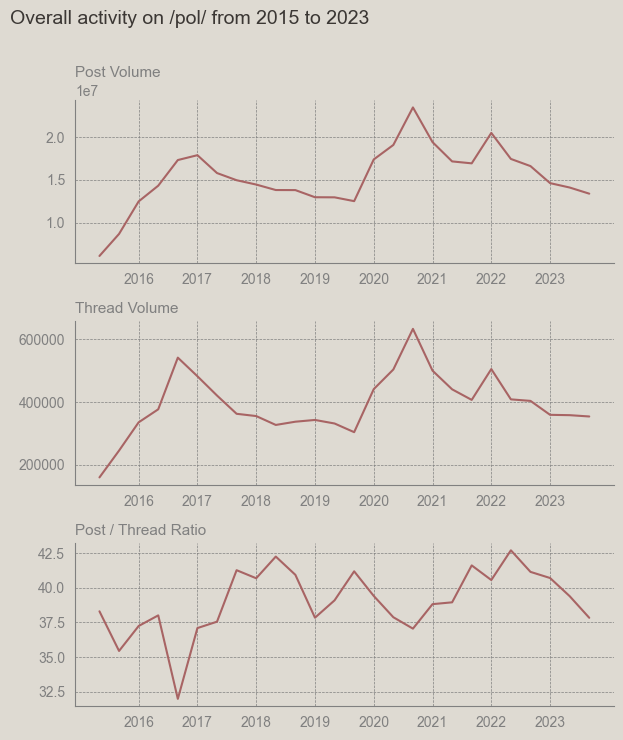

In [ ]:
da = pd.read_csv("volume.csv")
def format_time(t):
    parts = t.split("_")
    return f"{parts[0]}-{parts[1]}"
da["time_fmt"] = da["date"].apply(format_time)
da = da[da["time_fmt"] != "2015-01"]
da["ratio"] = da["op_0"] / (da["op_1"] + 1e-6)
df_melted = da.melt(id_vars="time_fmt", value_vars=["op_0", "op_1", "ratio"], var_name="metric", value_name="value")
metric_labels = {"op_0": "Post Volume", "op_1": "Thread Volume", "ratio": "Posts to Thread Ratio"}
df_melted["metric_label"] = df_melted["metric"].map(metric_labels)
sns.set_style("whitegrid")
plt.rcParams['axes.facecolor'] = '#dedad2'
plt.rcParams['figure.facecolor'] = '#dedad2'
g = sns.FacetGrid(df_melted, row="metric_label", sharex=False, sharey=False, height=2.5, aspect=2.5)
g.map_dataframe(sns.lineplot, x="time_fmt", y="value", color="#a86464")
year_ticks = [i for i, t in enumerate(da["time_fmt"].values) if t.endswith("-01")]
year_labels = [t.split("-")[0] for t in da["time_fmt"].values if t.endswith("-01")]
for ax, label in zip(g.axes.flat, df_melted["metric_label"].unique()):
    ax.set_xticks(year_ticks)
    ax.set_xticklabels(year_labels, rotation=0, ha='center', color="gray")
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray')
    ax.set_xlabel("", color="gray")
    ax.set_ylabel("", color="gray")
    ax.spines['top'].set_color('gray')
    ax.spines['bottom'].set_color('gray')
    ax.spines['left'].set_color('gray')
    ax.spines['right'].set_color('gray')
    ax.tick_params(colors="gray")
    ax.set_title(label, loc='left', fontsize=11, color="gray")
g.set_titles("")
g.fig.suptitle("Overall activity on /pol/ from 2015 to 2023", x=0.01, ha='left', fontsize=14, color="#3b3734")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


## 1B

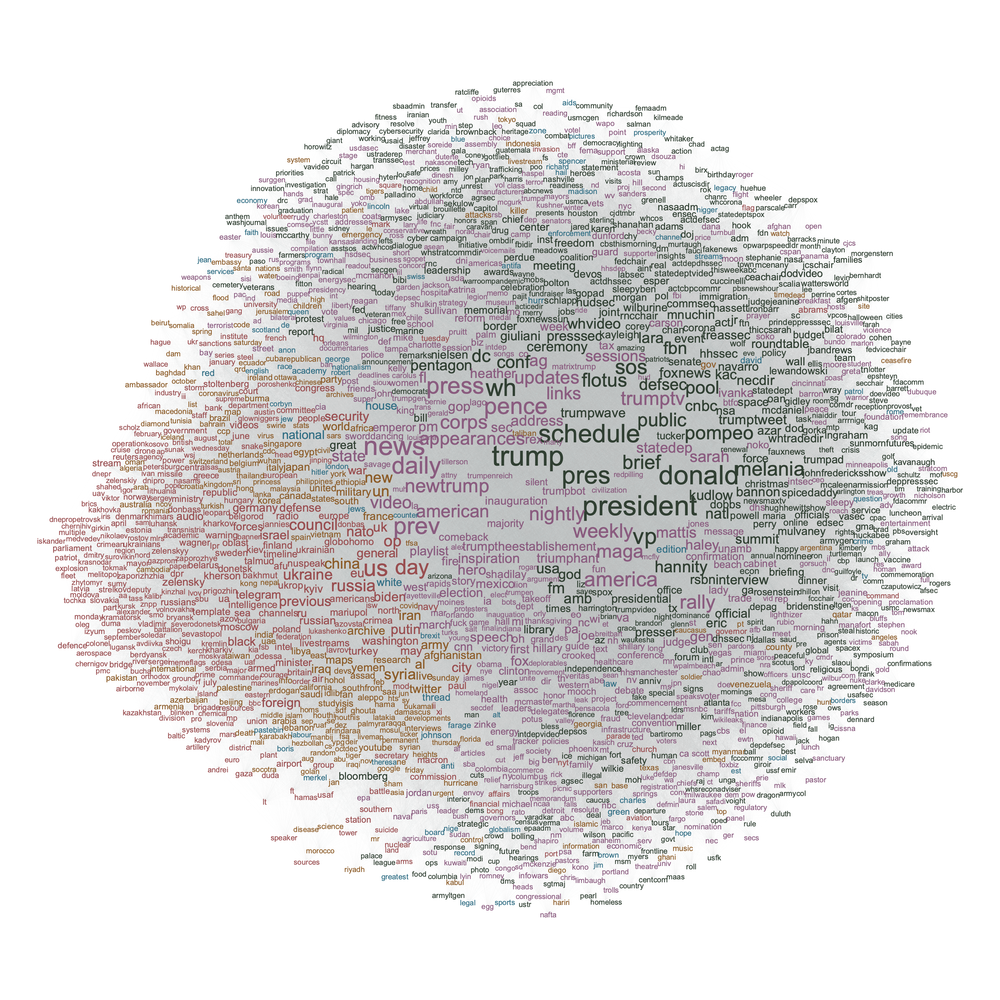

In [2]:
display(Image(filename = "g3.png", width = 3000))

In [8]:
pnouns = pd.read_csv("pnounsrank.csv", index_col = 0)

def summarize_word_timeseries(pnouns_df):
    df = pnouns_df.fillna(50).T  # words as rows, time as columns
    summary_df = pd.DataFrame(index=df.index)
    summary_df["mean"] = df.mean(axis=1)
    summary_df["std"] = df.std(axis=1)
    summary_df["cv"] = summary_df["std"] / (summary_df["mean"] + 1e-6)
    summary_df["max"] = df.max(axis=1)
    summary_df["peak_ratio"] = summary_df["max"] / (summary_df["mean"] + 1e-6)
    summary_df["peak_time"] = df.idxmax(axis=1)
    row_probs = df.div(df.sum(axis=1) + 1e-10, axis=0)
    summary_df["entropy"] = row_probs.apply(entropy, axis=1)
    summary_df["slope"] = df.apply(lambda row: linregress(range(len(row)), row.values).slope, axis=1)
    return summary_df

summary_df = summarize_word_timeseries(pnouns)

## 1C 
### 1C.1

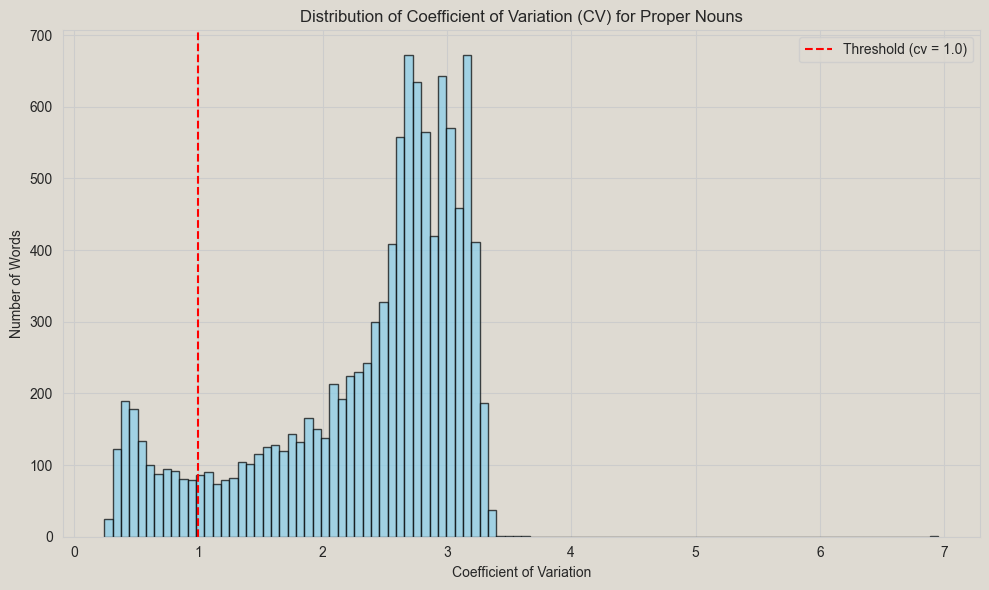

In [9]:
plt.figure(figsize=(10, 6))
plt.hist(summary_df["cv"], bins=100, color='skyblue', edgecolor='black', alpha=0.7)
plt.axvline(1.0, color='red', linestyle='--', label='Threshold (cv = 1.0)')
plt.title("Distribution of Coefficient of Variation (CV) for Proper Nouns")
plt.xlabel("Coefficient of Variation")
plt.ylabel("Number of Words")
plt.legend()
plt.tight_layout()
plt.show()

In [13]:
sorted_cvs = np.sort(summary_df["cv"].values)
x = np.arange(len(sorted_cvs))
knee = KneeLocator(x, sorted_cvs, curve="convex", direction="increasing")
cv_cutoff = sorted_cvs[knee.knee]
print (cv_cutoff)

3.380971760792098


In [14]:
summary_df["consistency"] = summary_df["cv"].apply(lambda x: "consistent" if x <= cv_cutoff else "inconsistent")

### 1C.2

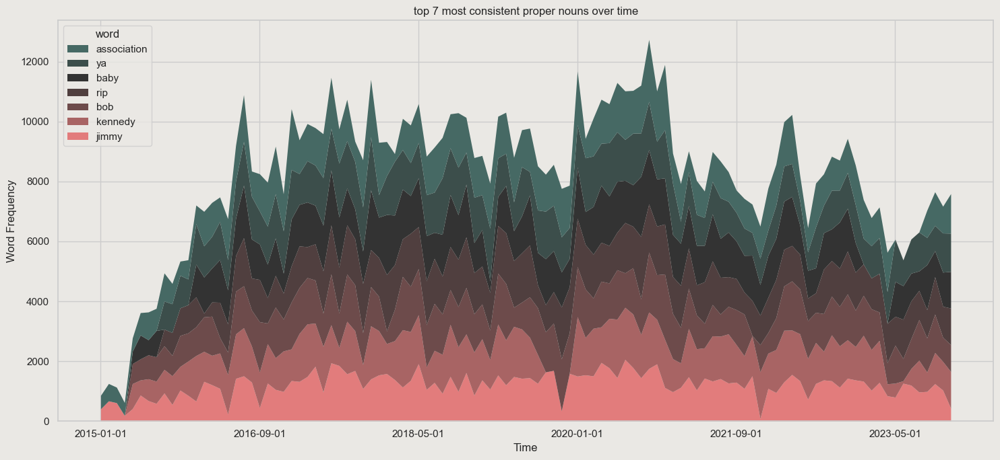

In [24]:
top20 = summary_df[summary_df["consistency"] == "consistent"].sort_values("mean", ascending=False).head(7).index
plot_df = pnouns[top20]

fig, ax = plt.subplots(figsize=(15, 7))
plot_df.plot.area(ax=ax, stacked=True, linewidth=0, color=custom_palette[:len(top20)])
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], title="word", loc="upper left")
ax.set_title("top 7 most consistent proper nouns over time")
ax.set_xlabel("Time")
ax.set_ylabel("Word Frequency")
plt.tight_layout()
plt.show()

## 1D

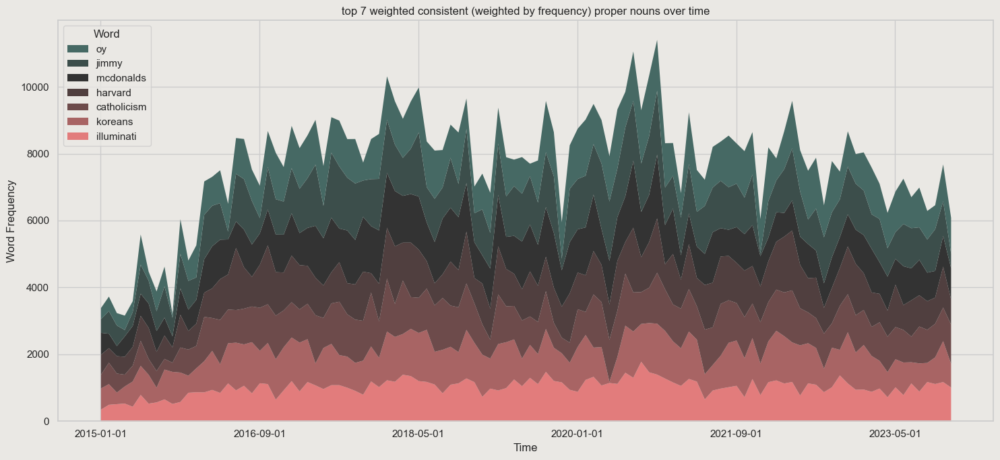

In [ ]:
summary_df["consistency_score"] = summary_df["mean"] / (summary_df["cv"] + 1e-6)
weighted_consistent = summary_df.sort_values("consistency_score", ascending=False).head(7).index
wait =  pnouns[weighted_consistent]

fig, ax = plt.subplots(figsize=(15, 7))
wait.plot.area(ax=ax, stacked=True, linewidth=0, color=custom_palette[:len(weighted_consistent)])
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], title="word", loc="upper left")
ax.set_title("top 7 consistent (weighted by frequency) proper nouns over time")
ax.set_xlabel("Time")
ax.set_ylabel("Word Frequency")
plt.tight_layout()
plt.show()


## 1E

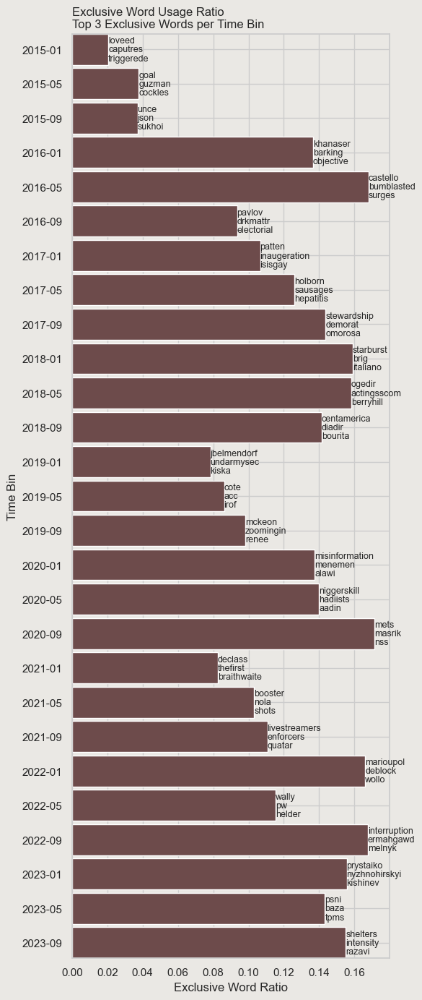

In [ ]:
pnouns_filled = pnouns.fillna(0)
pnouns_filled.index = pd.to_datetime(pnouns_filled.index)
binned = pnouns_filled.groupby(pd.Grouper(freq="4MS")).sum()
ratios, labels = [], []

for idx, row in binned.iterrows():
    mask = (binned > 0).astype(int).sum(axis=0) == 1
    total = row.sum()
    exclusive = row[mask]
    exclusive = exclusive[~exclusive.index.str.fullmatch("a+")]
    ratio = exclusive.sum() / (total + 1e-6)
    top = exclusive.sort_values(ascending=False).head(3).index.tolist()
    labels.append("\n".join(top))
    ratios.append(ratio)

ratio_df = pd.DataFrame({"ratio": ratios, "label": labels}, index=binned.index)
ratio_df.index = ratio_df.index.to_period("M").strftime('%Y-%m')

fig, ax = plt.subplots(figsize=(6, 14))
bars = ax.barh(ratio_df.index[::-1], ratio_df["ratio"][::-1], color="#6d4b4b", height=0.9)
for bar, label in zip(bars, ratio_df["label"][::-1]):
    ax.text(bar.get_width(), bar.get_y() + bar.get_height()/2, label,
            ha='left', va='center', fontsize=9, linespacing=1.0)
ax.set_xlim(0, ratio_df["ratio"].max() * 1.05)
ax.margins(y=0)
ax.set_title("Exclusive Word Usage Ratio\nTop 3 Exclusive Words per Time Bin", loc="left")
ax.set_xlabel("Exclusive Word Ratio")
ax.set_ylabel("Time Bin")
plt.tight_layout()
plt.show()

In [7]:
def clean_country(tag):
    tag = str(tag)
    tag = re.sub(r'^uniquelps\(\d+\)', '', tag)
    match = re.match(r'^(t?[A-Z]{2,3})', tag)
    return match.group(1) if match else None

rows = []
for path in sorted(glob("post_flags/*.csv")):
    month = os.path.basename(path).replace(".csv", "")
    df = pd.read_csv(path, header=None, index_col=0)
    df.index = df.index.map(clean_country)
    row = df.groupby(df.index)[1].sum()
    row.name = month
    rows.append(row)

db = pd.DataFrame(rows).fillna(0).astype(int)
db.to_csv("post_country.csv")


In [15]:
db.columns = pd.Index([col[:-1] if len(col) == 3 and col.endswith('N') else col for col in db.columns])
db = db.groupby(db.columns, axis=1).sum()
db.to_csv("post_country.csv")

/var/folders/87/9qwg67f164gck_jk0qq9fkc40000gn/T/ipykernel_4507/3608387948.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  db = db.groupby(db.columns, axis=1).sum()


## 1F

/var/folders/87/9qwg67f164gck_jk0qq9fkc40000gn/T/ipykernel_4507/748109968.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db_top["Other countries"] = db.drop(columns=top_countries).sum(axis=1)


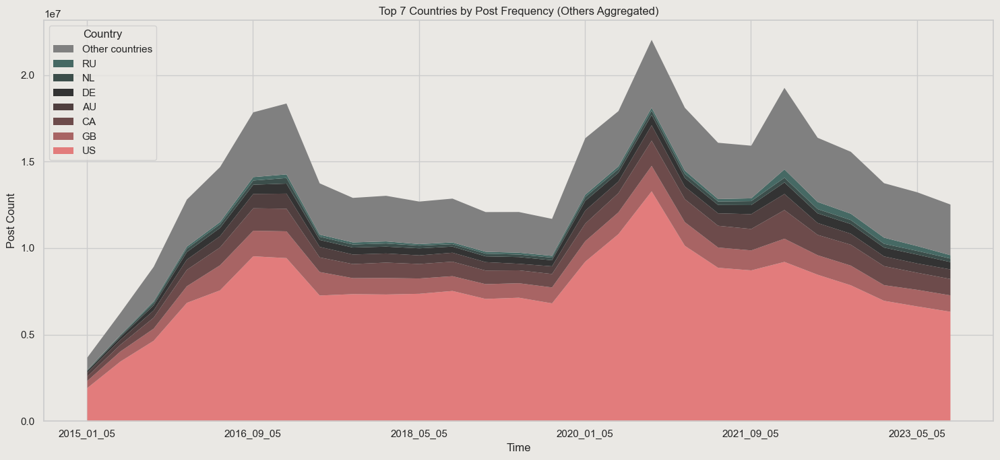

In [16]:
top_countries = db.sum().sort_values(ascending=False).head(7).index
db_top = db[top_countries]
db_top["Other countries"] = db.drop(columns=top_countries).sum(axis=1)

fig, ax = plt.subplots(figsize=(15, 7))
db_top.plot.area(ax=ax, stacked=True, linewidth=0, color=custom_palette[:7] + ['gray'])
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], title="Country", loc="upper left")
ax.set_title("Top 7 Countries by Post Frequency (Others Aggregated)")
ax.set_xlabel("Time")
ax.set_ylabel("Post Count")
plt.tight_layout()
plt.show()


## 2

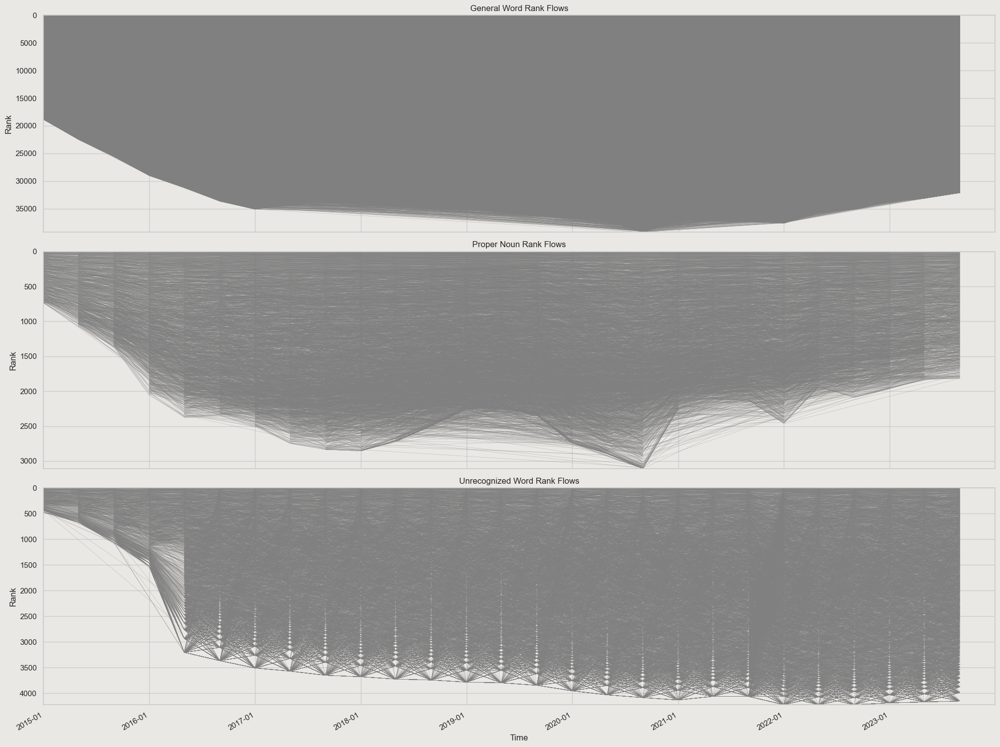

In [29]:
def plot_word_rank_data(counts_folder, pattern, title):
    files = sorted(glob(f"{counts_folder}/{pattern}"))
    all_data = []
    for f in files:
        fname = os.path.basename(f)
        match = re.search(r"(\d{4})_(\d{2})", fname)
        if not match:
            continue
        year, month = match.groups()
        time = pd.to_datetime(f"{year}-{month}")
        df = pd.read_csv(f)[['word', 'total_count']]
        df.columns = ['word', 'count']
        df['time'] = time
        all_data.append(df)

    if not all_data:
        raise ValueError(f"No valid data found in {counts_folder}")

    df_all = pd.concat(all_data)
    df_all = df_all.sort_values('time')
    pivoted = df_all.pivot_table(index='word', columns='time', values='count')
    return pivoted.rank(axis=0, method='min', ascending=False), df_all


fig, axes = plt.subplots(nrows=3, figsize=(20, 15), sharex=True)
datasets = [
    ("counters/gen_counts", "*_pol_cleaned_full_counts.csv", "General Word Rank Flows"),
    ("counters/pnouns_counts", "*_counts.csv", "Proper Noun Rank Flows"),
    ("counters/unrec_counts", "*_pol_cleaned_full_counts.csv", "Unrecognized Word Rank Flows")
]

xmin = pd.to_datetime("2015-01-01")
xmax = pd.to_datetime("2023-12-31")

for ax, (folder, pattern, title) in zip(axes, datasets):
    ranks, df_all = plot_word_rank_data(folder, pattern, title)
    for word in ranks.index:
        series = ranks.loc[word].dropna()
        if len(series) < 1:
            continue
        times = series.index.to_list()
        ranks_vals = series.values.tolist()
        points = list(zip(mdates.date2num(times), ranks_vals))
        segments = [[points[j], points[j+1]] for j in range(len(points) - 1)]
        lc = LineCollection(segments, colors='gray', linewidths=0.3, alpha=0.6)
        ax.add_collection(lc)
    ax.set_xlim(mdates.date2num(xmin), mdates.date2num(xmax))
    ax.set_ylim(ranks.max().max(), 0)
    ax.set_ylabel("Rank")
    ax.set_title(title)
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))


axes[-1].set_xlabel("Time")
fig.autofmt_xdate()
plt.tight_layout()
plt.show()





## 2A

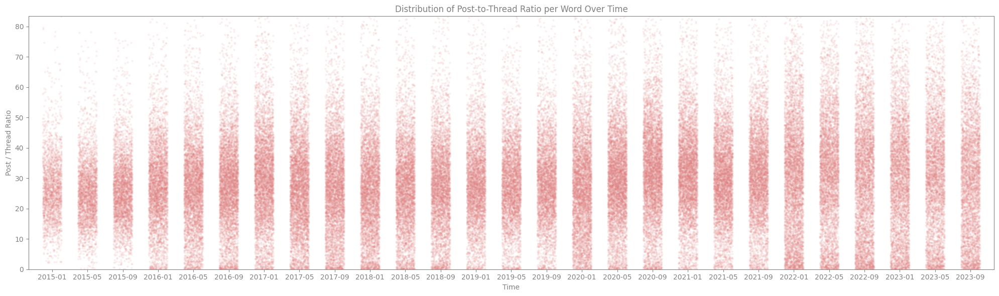

In [29]:
folder = "counters/gen_counts"
all_data = []
def format_time(t):
    parts = t.split("_")
    return f"{parts[0]}-{parts[1]}"
for fname in sorted(os.listdir(folder)):
    if not fname.endswith("_counts.csv"):
        continue
    date = fname.replace("_pol_cleaned_full_counts.csv", "")
    df = pd.read_csv(os.path.join(folder, fname))
    df["total"] = df["op_count"] + df["post_count"]
    df = df[df["op_count"] > 100]
    df["ratio"] = df["post_count"] / (df["op_count"] + 1e-6)
    df["time"] = date
    all_data.append(df[["word", "ratio", "time"]])
df_all = pd.concat(all_data, ignore_index=True)
df_all["time_fmt"] = df_all["time"].apply(format_time)
time_order = sorted(df_all["time_fmt"].unique())
x_locs = {t: i * 1.5 for i, t in enumerate(time_order)}  # extra spacing
df_all["x"] = df_all["time_fmt"].map(x_locs) + np.random.uniform(-0.4, 0.4, size=len(df_all))
plt.figure(figsize=(20, 6))
ax = plt.gca()
plt.scatter(df_all["x"], df_all["ratio"], alpha=0.08, s=5, color="#e27c7c")
ax.set_xticks(list(x_locs.values()))
ax.set_xticklabels(list(x_locs.keys()), rotation=0, ha='center')
ax.set_xlim(min(x_locs.values()) - 1, max(x_locs.values()) + 1)
ax.set_ylim(0, df_all["ratio"].quantile(0.99))
ax.spines['top'].set_color('gray')
ax.spines['bottom'].set_color('gray')
ax.spines['left'].set_color('gray')
ax.spines['right'].set_color('gray')
ax.tick_params(colors='gray')
plt.ylabel("Post / Thread Ratio", color="gray")
plt.xlabel("Time", color="gray")
plt.title("Distribution of Post-to-Thread Ratio per Word Over Time", color="gray")
plt.tight_layout()
plt.show()



/var/folders/87/9qwg67f164gck_jk0qq9fkc40000gn/T/ipykernel_53403/2133422368.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='center', color="gray")


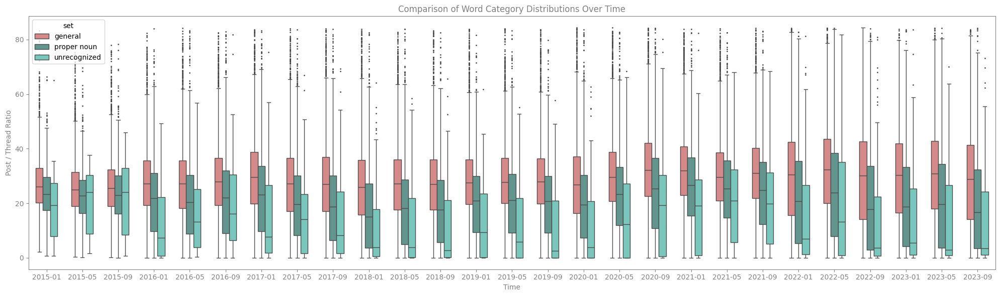

In [36]:
def load_counts(folder, label):
    all_data = []
    for fname in sorted(os.listdir(folder)):
        if not fname.endswith("_counts.csv"):
            continue
        date = fname.replace("_pol_cleaned_full_counts.csv", "")
        df = pd.read_csv(os.path.join(folder, fname))
        df["total"] = df["op_count"] + df["post_count"]
        df = df[df["total"] > 0]
        df = df[df["op_count"] > 100]
        df["ratio"] = df["post_count"] / (df["op_count"] + 1e-6)
        df["time"] = date
        df["set"] = label
        all_data.append(df[["word", "ratio", "time", "set"]])
    return pd.concat(all_data, ignore_index=True)

gen = load_counts("counters/gen_counts", "general")
unrec = load_counts("counters/unrec_counts", "unrecognized")
pnoun = load_counts("counters/pnouns_counts", "proper noun")
df_all = pd.concat([gen, pnoun, unrec], ignore_index=True)
df_all["time_fmt"] = df_all["time"].apply(lambda t: f"{t.split('_')[0]}-{t.split('_')[1]}")

ratio_cap = df_all["ratio"].quantile(0.99)
df_all = df_all[df_all["ratio"] <= ratio_cap]

plt.figure(figsize=(20, 6))
ax = plt.gca()

sns.boxplot(data=df_all, x="time_fmt", y="ratio", hue="set", width=0.6, fliersize=1, palette=["#e27c7c", "#599e94", "#6cd4c5"])

ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='center', color="gray")
ax.spines['top'].set_color('gray')
ax.spines['bottom'].set_color('gray')
ax.spines['left'].set_color('gray')
ax.spines['right'].set_color('gray')
ax.tick_params(colors='gray')
ax.set_xlabel("Time", color="gray")
ax.set_ylabel("Post / Thread Ratio", color="gray")
plt.title("Comparison of Word Category Distributions Over Time", color="gray")
plt.tight_layout()
plt.show()

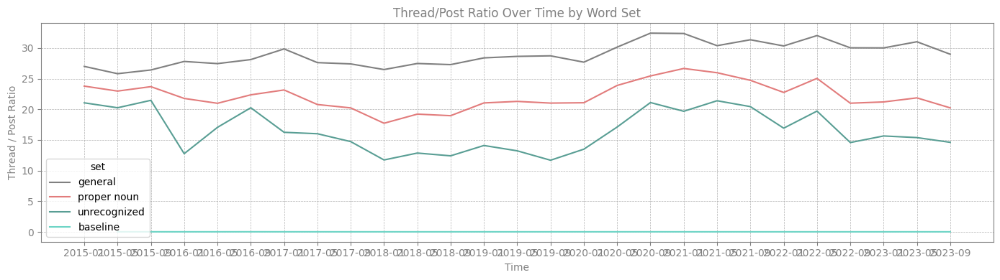

In [37]:
df_all_grouped = df_all.groupby(["time_fmt", "set"])["ratio"].mean().reset_index()

baseline = pd.read_csv("volume.csv")
baseline["time_fmt"] = baseline["date"].apply(lambda t: f"{t.split('_')[0]}-{t.split('_')[1]}")
baseline = baseline[baseline["time_fmt"] != "2015-01"]
baseline["set"] = "baseline"
baseline["ratio"] = baseline["op_1"] / (baseline["op_0"] + 1e-6)
baseline = baseline[["time_fmt", "set", "ratio"]]

plot_df = pd.concat([df_all_grouped, baseline], ignore_index=True)

plt.figure(figsize=(14, 4))
sns.lineplot(data=plot_df, x="time_fmt", y="ratio", hue="set",
             palette=["gray", "#e27c7c", "#599e94", "#6cd4c5"])
plt.xticks(rotation=0, ha='center')
plt.xlabel("Time", color="gray")
plt.ylabel("Thread / Post Ratio", color="gray")
plt.title("Thread/Post Ratio Over Time by Word Set", color="gray")
plt.grid(True, linestyle="--", linewidth=0.5)
plt.gca().spines['top'].set_color('gray')
plt.gca().spines['bottom'].set_color('gray')
plt.gca().spines['left'].set_color('gray')
plt.gca().spines['right'].set_color('gray')
plt.tick_params(colors="gray")
plt.tight_layout()
plt.show()

## 2B

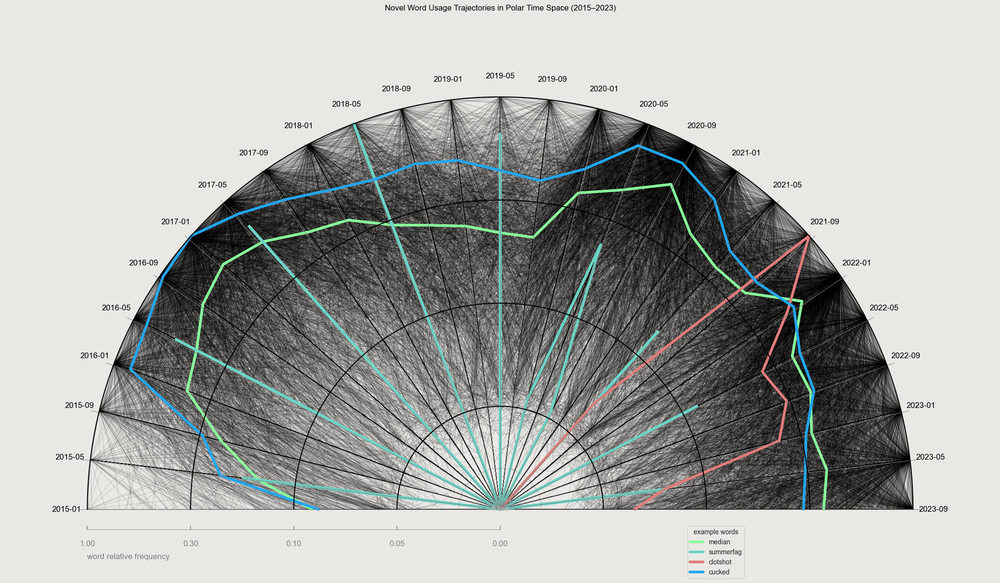

In [32]:
df = pd.read_csv('pol_2014_2024_timeline.csv', index_col=0)
df = df.loc[:, df.columns.str.startswith(('2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023'))]
df = df.loc[df.sum(axis=1).sort_values(ascending=False).index]

def custom_radius_transform(r):
    if r >= 0.75:
        return 0.3 + 0.7 * (r - 0.75) / 0.25       # maps to 0.3–1.0
    elif r >= 0.5:
        return 0.1 + 0.2 * (r - 0.5) / 0.25        # maps to 0.1-0.3
    elif r >= 0.25:
        return 0.05 + 0.05 * (r - 0.25) / 0.25       # maps to 0.05 -0.1
    else:
        return 0.0 + 0.05 * r / 0.25                # maps to 0.0–0.05
    

def highlight_words(ax, words, color='red', linewidth=1.5):
    for word in words:
        if word not in word_paths:
            continue
        values = word_paths[word]
        times = values[::2]
        freqs = np.array(values[1::2], dtype=float)
        log_freqs = np.log1p(freqs)
        if np.max(log_freqs) == 0:
            continue
        normed = log_freqs / np.max(log_freqs)
        scaled = np.array([custom_radius_transform(r) for r in normed])
        angles_for_word = np.array([angle_map[t] + np.pi/2 for t in times])
        x = -scaled * np.cos(angles_for_word)
        y = scaled * np.sin(angles_for_word)
        ax.plot(x, y, color=color, linewidth=linewidth, alpha=1, label=word)

time_cols = df.columns.sort_values()
angles = np.linspace(-np.pi/2, np.pi/2, len(time_cols))
angle_map = dict(zip(time_cols, angles))
word_paths = {}
for word in df.index:
    values = []
    for col in time_cols:
        freq = df.at[word, col]
        values.extend([col, freq])
    word_paths[word] = values
fig, ax = plt.subplots(figsize=(28, 14))
ax.set_facecolor("blue")
for word, values in word_paths.items():
    times = values[::2]
    freqs = np.array(values[1::2], dtype=float)
    log_freqs = np.log1p(freqs)
    if np.max(log_freqs) == 0:
        continue
    normed = log_freqs / np.max(log_freqs)
    scaled = np.array([custom_radius_transform(r) for r in normed])
    angles_for_word = np.array([angle_map[t] + np.pi/2 for t in times])
    x = -scaled * np.cos(angles_for_word)
    y = scaled * np.sin(angles_for_word)
    ax.plot(x, y, color='black', alpha=0.2, linewidth=0.6)

log_df = np.log1p(df)
normed_per_word = log_df.divide(log_df.max(axis=1).replace(0, 1e-6), axis=0)
normed_per_word = normed_per_word.replace(0, np.nan)
median_traj = normed_per_word.median(axis=0, skipna=True)
scaled_median = np.array([custom_radius_transform(r) for r in median_traj])
angles_median = np.array([angle_map[t] + np.pi/2 for t in time_cols])
x_median = -scaled_median * np.cos(angles_median)
y_median = scaled_median * np.sin(angles_median)
ax.plot(x_median, y_median, color='#8aff9c', linewidth=4, alpha=1.0, label='median')

highlight_words(ax, ['summerfag'], color='#6cd4c5', linewidth=4)
highlight_words(ax, ['clotshot'], color='#e27c7c', linewidth=4)
highlight_words(ax, ['cucked'], color='#22a7f0', linewidth=4)

for i, angle in enumerate(angles):
    angle_rot = angle + np.pi/2
    r_outer = 1.02
    x1, y1 = np.cos(angle_rot), np.sin(angle_rot)
    ax.plot([0, -r_outer * x1], [0, y1], color='gray', lw=0.8, alpha=0.9)
    label_radius = 1.05
    ax.text(-label_radius * x1, label_radius * y1, time_cols[i], fontsize=12, color='black', ha='center', va='center')
for r in [0.25, 0.5, 0.75, 1.0]:
    display_r = custom_radius_transform(r)
    arc_x = -display_r * np.cos(angles + np.pi/2)
    arc_y = display_r * np.sin(angles + np.pi/2)
    ax.plot(arc_x, arc_y, color='gray', lw=0.8, alpha=0.5)

ax.text(0, 0, '0 freq', ha='center', va='center', color='lightgray', fontsize=10)
ax.set_xlim(-1.2, 1.2)
ax.set_ylim(-0.05, 1.2)
ax.set_aspect('equal')
ax.axis('off')

r_tick_vals = [0.0, 0.05, 0.1, 0.3, 1.0]
full_r = custom_radius_transform(1.0)
tick_xs = np.linspace(0, -custom_radius_transform(1.0), len(r_tick_vals))

bar_y = -0.05
ax.plot([tick_xs[0], tick_xs[-1]], [bar_y, bar_y], color='gray', lw=1.2)
for x, label in zip(tick_xs, r_tick_vals):
    ax.plot([x, x], [bar_y - 0.01, bar_y + 0.01], color='gray', lw=1.2)
    ax.text(x, bar_y - 0.025, f"{label:.2f}", fontsize=12, ha='center', va='top', color='gray')
ax.text(-1, bar_y - 0.07, "word relative frequency", fontsize=12, ha='left', color='gray')

ax.legend(loc='lower right', bbox_to_anchor=(0.75, -0.1), frameon=True, fontsize=10, title="example words",
    title_fontsize=10
)
theta = np.linspace(0, np.pi, 300)
for x_tick in tick_xs:
    radius = abs(x_tick)
    arc_x = -radius * np.cos(theta)
    arc_y = radius * np.sin(theta)
    ax.plot(arc_x, arc_y, color='black', lw=1.5, alpha=1, zorder=100)


plt.title("Novel Word Usage Trajectories in Polar Time Space (2015–2023)", color='black')
plt.show()

